In [1]:
#*****************************************************************
#If you have any questions please use Q&A section on www.udemy.com
#Author - jaro.algo@icloud.com
#*****************************************************************

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
import datetime
import os
import matplotlib.style
from pandas.core.common import flatten
from functools import partial, reduce
from scipy.signal import argrelextrema

In [3]:
plt.style.use('ggplot')

In [4]:
# path = '/Users/testing/Documents/Udemy Strategies/Strategy 10 - Martingale'

In [5]:
# pairs_list = []
# for filename in os.listdir(path):
#     if filename.endswith('.csv'):
#         pairs_list.append(filename.split('.')[0])
# print(pairs_list)

# df = {}
# for pair in range(len(pairs_list)):
#     df[pair] = pd.read_csv(pairs_list[pair]+'.csv', header = 0)
#     df[pair].columns = ['Date', 'Open', 'High', 'Low', 'Close', 'Volume']
#     df[pair]['Date'] = df[pair]['Date'].str.split(' ').str[0:2]
#     df[pair]['Date'] = df[pair]['Date'].str.join(' ')
#     df[pair].set_index('Date', inplace = True)
#     df[pair].index = pd.to_datetime(df[pair].index, format = '%d.%m.%Y %H:%M:%S.%f')
#     df[pair]['Day'] = df[pair].index.dayofweek
#     dmap = {0: 'Mon', 1: 'Tue', 2: 'Wed', 3: 'Thu', 4: 'Fri', 5: 'Sat', 6: 'Sun'}
#     df[pair]['Day'] = df[pair]['Day'].map(dmap)
#     df[pair]['min'] = ''
#     df[pair]['max'] = ''

In [6]:
pairs_list = [
    'EURUSD/EURUSD_H4 - EURUSD_H4',
    'AUDUSD/AUDUSD_H4 - AUDUSD_H4',
    'GBPUSD/GBPUSD_H4 - GBPUSD_H4',
    'NZDUSD/NZDUSD_H4 - NZDUSD_H4',
    'USDCAD/USDCAD_H4 - USDCAD_H4',
    'USDCHF/USDCHF_H4 - USDCHF_H4',
    'USDJPY/USDJPY_H4 - USDJPY_H4',
    'XAUUSD/XAUUSD_H4 - XAUUSD_H4',
]

In [7]:
df ={}
for pair in range(len(pairs_list)) :
    df[pair] = pd.read_csv('../../Data_Forex/'+pairs_list[pair]+'.csv',index_col=0,parse_dates=True)
    df[pair]['Day'] = df[pair].index.dayofweek
    dmap = {0: 'Mon', 1: 'Tue', 2: 'Wed', 3: 'Thu', 4: 'Fri', 5: 'Sat', 6: 'Sun'}
    df[pair]['Day'] = df[pair]['Day'].map(dmap)
    df[pair]['min'] = None
    df[pair]['max'] = None

In [8]:
def ATR(df, n):
    df = df.copy()
    df['High-Low'] = abs(df['High'] - df['Low'])
    df['High-PrevClose'] = abs(df['High'] - df['Close'].shift(1))
    df['Low-PrevClose'] = abs(df['Low'] - df['Close'].shift(1))
    df['TR'] = df[['High-Low', 'High-PrevClose', 'Low-PrevClose']].max(axis = 1, skipna = False)
    df['ATR'] = df['TR'].rolling(n).mean()
    df = df.drop(['High-Low', 'High-PrevClose', 'Low-PrevClose'], axis = 1)
    return df

def CAGR(df, source_df):
    df = df.copy()
    n = len(source_df) / (252*24)
    return round((((df['cum_res'][-1] / account_size)**(1/n)) - 1) * 100, 1)

def sharpe_ratio(df):
    df = df.copy()
    returns = df['cum_res'].pct_change()
    volatility = returns.std() * np.sqrt(252)
    return round((returns.mean() - 0.02) / volatility, 2)

def max_drawdown(df):
    df = df.copy()
    cum_returns = (1 + df['cum_res']).cumprod()
    drawdown = 1 - df['cum_res'].div(df['cum_res'].cummax())
    return round(max(drawdown.expanding().max() * 100), 2)

In [9]:
#Strategy parameters
account_size = 10000
slippage = 2
size = 1
ATR_SL = 0.5

plot_trades = False

for pair in range(len(pairs_list)):
    df[pair]['ATR'] = ATR(df[pair], 20)['ATR']
    df[pair]['direction'] = np.where(df[pair]['Close'] > df[pair]['Open'], 'bull', 'bear')
    df[pair]['dir_count'] = df[pair].groupby((df[pair]['direction'] != df[pair]['direction'].shift(1)).cumsum()).cumcount()+1
    if 'JPY' not in pairs_list[pair]:
        df[pair]['spread'] = float(slippage) / float(10000)
        df[pair]['size'] = float(size) * float(10000)
        print('Pair: ', pairs_list[pair], 'a')
    else:
        df[pair]['spread'] = float(slippage) / float(100)
        df[pair]['size'] = float(size) * float(100)
        print('Pair: ', pairs_list[pair], 'b')

Pair:  EURUSD/EURUSD_H4 - EURUSD_H4 a
Pair:  AUDUSD/AUDUSD_H4 - AUDUSD_H4 a
Pair:  GBPUSD/GBPUSD_H4 - GBPUSD_H4 a
Pair:  NZDUSD/NZDUSD_H4 - NZDUSD_H4 a
Pair:  USDCAD/USDCAD_H4 - USDCAD_H4 a
Pair:  USDCHF/USDCHF_H4 - USDCHF_H4 a
Pair:  USDJPY/USDJPY_H4 - USDJPY_H4 b
Pair:  XAUUSD/XAUUSD_H4 - XAUUSD_H4 a


In [10]:
for pair in range(len(pairs_list)):
    print('In', pairs_list[pair], 'dataframe is:', len(df[pair][df[pair]['direction'] == 'bull']), 'bullish candles and', 
         len(df[pair][df[pair]['direction'] == 'bear']), 'bearish candles')
    print('Maximum following candles of same direction is', max(df[pair]['dir_count']))
    print('Average number of following candles of same direction is', sum(df[pair]['dir_count']) / len(df[pair]['dir_count']))
    print(round(len(df[pair][df[pair]['dir_count'] == 1]) / len(df[pair]) * 100, 1), '% of the time market changed direction afte one candle \n')

In EURUSD/EURUSD_H4 - EURUSD_H4 dataframe is: 12897 bullish candles and 12949 bearish candles
Maximum following candles of same direction is 13
Average number of following candles of same direction is 1.9471871856380099
51.2 % of the time market changed direction afte one candle 

In AUDUSD/AUDUSD_H4 - AUDUSD_H4 dataframe is: 12955 bullish candles and 12920 bearish candles
Maximum following candles of same direction is 14
Average number of following candles of same direction is 1.9454299516908213
51.0 % of the time market changed direction afte one candle 

In GBPUSD/GBPUSD_H4 - GBPUSD_H4 dataframe is: 12885 bullish candles and 12961 bearish candles
Maximum following candles of same direction is 11
Average number of following candles of same direction is 1.8944904433954963
51.9 % of the time market changed direction afte one candle 

In NZDUSD/NZDUSD_H4 - NZDUSD_H4 dataframe is: 12871 bullish candles and 12977 bearish candles
Maximum following candles of same direction is 14
Average nu

In [11]:
def trade_plot(df, trade, exit_price, exit_date):
    plt.figure(figsize = (25, 8))
    plt.title(trade['signal'] + ' - With result: ' + str(round(trade['result'], 2)))
    plt.plot(df['Close'][(trade['date_of_trade'] - datetime.timedelta(days = 1000)): (trade['date_of_trade'] + datetime.timedelta(days = 30))], color = 'blue')
    plt.axhline(trade['TP'], color = 'green', ls = ':')
    plt.axhline(trade['SL'], color = 'red', ls = ':')
    plt.scatter(df.index, df['min'], color = 'red', s = 100)
    plt.scatter(df.index, df['max'], color = 'green', s = 100)
    plt.scatter(trade['date_of_trade'], trade['entry_price'], color = 'yellow', s = 200)
    plt.scatter(exit_date, exit_price, color = 'orange', s = 200)
    
    plt.show()

In [12]:
open_trade = {}
trade = {}
long_take_profit = {}
short_take_profit = {}
long_stop_loss = {}
short_stop_loss = {}
long_entry_price = {}
short_entry_price = {}
size_multiplier = {}

for pair in range(len(pairs_list)):
    open_trade[pair] = []
    trade[pair] = {}
    long_take_profit[pair] = []
    short_take_profit[pair] = []
    long_stop_loss[pair] = []
    short_stop_loss[pair] = []
    long_entry_price[pair] = []
    short_entry_price[pair] = []
    
    size_multiplier[pair] = 1
    
    for i in range(50, len(df[pair])):
        #Buy
        if df[pair]['direction'][i - 1] == 'bear' and len(open_trade[pair]) == 0:
            print(i, 'New Long trade at price:', round(df[pair]['Close'][i], 4), ' On day:', df[pair].index[i], 'Pair:', pairs_list[pair])
            trade[pair][i] = {'ID': i,
                              'date_of_trade': df[pair].index[i],
                              'day_of_trade': df[pair]['Day'][i],
                              'entry_price': df[pair]['Open'][i],
                              'signal': 'Buy',
                              'result': 0,
                              'TP': df[pair]['Open'][i] + df[pair]['ATR'].mean(),
                              'SL': df[pair]['Open'][i] - df[pair]['ATR'].mean()}
            open_trade[pair].append(i)
            long_take_profit[pair].append(trade[pair][i]['TP'])
            long_stop_loss[pair].append(trade[pair][i]['SL'])
            long_entry_price[pair].append(trade[pair][i]['entry_price'])
        
        #Sell
        if df[pair]['direction'][i - 1] == 'bull' and len(open_trade[pair]) == 0:
            print(i, 'New Short trade at price:', round(df[pair]['Close'][i], 4), ' On day:', df[pair].index[i], 'Pair:', pairs_list[pair])
            trade[pair][i] = {'ID': i,
                              'date_of_trade': df[pair].index[i],
                              'day_of_trade': df[pair]['Day'][i],
                              'entry_price': df[pair]['Open'][i],
                              'signal': 'Sell',
                              'result': 0,
                              'TP': df[pair]['Open'][i] - df[pair]['ATR'].mean(),
                              'SL': df[pair]['Open'][i] + df[pair]['ATR'].mean()}
            open_trade[pair].append(i)
            short_take_profit[pair].append(trade[pair][i]['TP'])
            short_stop_loss[pair].append(trade[pair][i]['SL'])
            short_entry_price[pair].append(trade[pair][i]['entry_price'])
            
        #Exit trades---------------------------------------------------------------------------
        #Buy profit
        if any(y <= df[pair]['Close'][i] for y in long_take_profit[pair]):
            for j in open_trade[pair]:
                if trade[pair][j].get('result', {}) == 0 and trade[pair][j].get('signal', {}) == 'Buy':
                    if df[pair]['Close'][i] >= trade[pair][j]['TP']:
                        trade[pair][j].update({'result' : (trade[pair][j]['TP'] - trade[pair][j]['entry_price']) * size_multiplier[pair] * df[pair]['size'][i]\
                                              - df[pair]['spread'][i]})
                        print(j, 
                             'Long profit at price:', round(df[pair]['Close'][i], 4),
                             'On day:', df[pair].index[i],
                             'With profit:', round(trade[pair][j]['result'], 4), '\n')
                        open_trade[pair].remove(j)
                        long_take_profit[pair].remove(trade[pair][j]['TP'])
                        long_stop_loss[pair].remove(trade[pair][j]['SL'])
                        size_multiplier[pair] = 1
                    #plot trade
                    if plot_trades == True:
                        trade_plot(df[pair][i - 1000: i + 30], trade[pair][j], df[pair]["Close"][i], df[pair].index[i])
        #Buy loss
        if any(y >= df[pair]['Close'][i] for y in long_stop_loss[pair]):
            for j in open_trade[pair]:
                if trade[pair][j].get('result', {}) == 0 and trade[pair][j].get('signal', {}) == 'Buy':
                    if df[pair]['Close'][i] <= trade[pair][j]['SL']:
                        trade[pair][j].update({'result' : (trade[pair][j]['SL'] - trade[pair][j]['entry_price']) * size_multiplier[pair] * df[pair]['size'][i]\
                                              - df[pair]['spread'][i]})
                        print(j, 
                             'Long loss at price:', round(df[pair]['Close'][i], 4),
                             'On day:', df[pair].index[i],
                             'With loss:', round(trade[pair][j]['result'], 4), '\n')
                        open_trade[pair].remove(j)
                        long_take_profit[pair].remove(trade[pair][j]['TP'])
                        long_stop_loss[pair].remove(trade[pair][j]['SL'])
                        size_multiplier[pair] = size_multiplier[pair] * 2
                    #plot trade
                    if plot_trades == True:
                        trade_plot(df[pair][i - 1000: i + 30], trade[pair][j], df[pair]["Close"][i], df[pair].index[i])
                        
        #Sell profit
        if any(y >= df[pair]['Close'][i] for y in short_take_profit[pair]):
            for j in open_trade[pair]:
                if trade[pair][j].get('result', {}) == 0 and trade[pair][j].get('signal', {}) == 'Sell':
                    if df[pair]['Close'][i] <= trade[pair][j]['TP']:
                        trade[pair][j].update({'result' : (trade[pair][j]['entry_price'] - trade[pair][j]['TP']) * size_multiplier[pair] * df[pair]['size'][i]\
                                              - df[pair]['spread'][i]})
                        print(j, 
                             'Short profit at price:', round(df[pair]['Close'][i], 4),
                             'On day:', df[pair].index[i],
                             'With profit:', round(trade[pair][j]['result'], 4), '\n')
                        open_trade[pair].remove(j)
                        short_take_profit[pair].remove(trade[pair][j]['TP'])
                        short_stop_loss[pair].remove(trade[pair][j]['SL'])
                        size_multiplier[pair] = 1
                    #plot trade
                    if plot_trades == True:
                        trade_plot(df[pair][i - 1000: i + 30], trade[pair][j], df[pair]["Close"][i], df[pair].index[i])
        #Sell loss
        if any(y <= df[pair]['Close'][i] for y in short_stop_loss[pair]):
            for j in open_trade[pair]:
                if trade[pair][j].get('result', {}) == 0 and trade[pair][j].get('signal', {}) == 'Sell':
                    if df[pair]['Close'][i] >= trade[pair][j]['SL']:
                        trade[pair][j].update({'result' : (trade[pair][j]['entry_price'] - trade[pair][j]['SL']) * size_multiplier[pair] * df[pair]['size'][i]\
                                              - df[pair]['spread'][i]})
                        print(j, 
                             'Short loss at price:', round(df[pair]['Close'][i], 4),
                             'On day:', df[pair].index[i],
                             'With loss:', round(trade[pair][j]['result'], 4), '\n')
                        open_trade[pair].remove(j)
                        short_take_profit[pair].remove(trade[pair][j]['TP'])
                        short_stop_loss[pair].remove(trade[pair][j]['SL'])
                        size_multiplier[pair] = size_multiplier[pair] * 2
                    #plot trade
                    if plot_trades == True:
                        trade_plot(df[pair][i - 1000: i + 30], trade[pair][j], df[pair]["Close"][i], df[pair].index[i])

50 New Short trade at price: 1.3232  On day: 2007-03-15 16:00:00 Pair: EURUSD/EURUSD_H4 - EURUSD_H4
50 Short loss at price: 1.3291 On day: 2007-03-16 00:00:00 With loss: -39.7174 

53 New Short trade at price: 1.3306  On day: 2007-03-16 04:00:00 Pair: EURUSD/EURUSD_H4 - EURUSD_H4
53 Short loss at price: 1.3387 On day: 2007-03-21 16:00:00 With loss: -79.4347 

76 New Short trade at price: 1.3396  On day: 2007-03-21 20:00:00 Pair: EURUSD/EURUSD_H4 - EURUSD_H4
76 Short profit at price: 1.3334 On day: 2007-03-22 16:00:00 With profit: 158.8687 

82 New Long trade at price: 1.3328  On day: 2007-03-22 20:00:00 Pair: EURUSD/EURUSD_H4 - EURUSD_H4
82 Long loss at price: 1.3287 On day: 2007-03-23 16:00:00 With loss: -39.7174 

88 New Long trade at price: 1.3279  On day: 2007-03-23 20:00:00 Pair: EURUSD/EURUSD_H4 - EURUSD_H4
88 Long profit at price: 1.3334 On day: 2007-03-26 12:00:00 With profit: 79.4343 

94 New Short trade at price: 1.3327  On day: 2007-03-26 16:00:00 Pair: EURUSD/EURUSD_H4 - EU

In [13]:
pairs_results = {}
profits = {}
losses = {}
be = {}

for pair in range(len(pairs_list)):
    profits[pair] = []
    losses[pair] = []
    be[pair] = []
    
    pairs_results[pair] = pd.DataFrame.from_dict({(i, j): trade[pair][j] for j in trade[pair].keys()}, orient = 'index')
    pairs_results[pair] = pairs_results[pair].drop(['signal', 'ID', 'TP', 'SL'], axis = 1)
    pairs_results[pair].set_index('date_of_trade', inplace = True)
    pairs_results[pair]['cum_res'] = pairs_results[pair]['result'].cumsum() + account_size
    
    for t in trade[pair]:
        profits[pair].append(trade[pair][t]['result']) if trade[pair][t]['result'] > 0.1 else ''
        losses[pair].append(trade[pair][t]['result']) if trade[pair][t]['result'] < -0.1 else ''
        be[pair].append(trade[pair][t]['result']) if -0.1 <= trade[pair][t]['result'] <= 0.1 else ''
        
my_reduce = partial(pd.merge, on = 'date_of_trade', how = 'outer')
strategy_results = reduce(my_reduce, pairs_results.values())
strategy_results = strategy_results.sort_index()
strategy_results['final_res'] = strategy_results.filter(like = 'result', axis = 1).sum(axis = 1)
strategy_results['cum_res'] = strategy_results['final_res'].cumsum() + account_size

profits_keys = list(profits.keys())
profits_values = [profits[x] for x in profits_keys]
str_profits = list(flatten(profits_values))

losses_keys = list(losses.keys())
losses_values = [losses[x] for x in losses_keys]
str_losses = list(flatten(losses_values))

be_keys = list(be.keys())
be_values = [be[x] for x in be_keys]
str_be = list(flatten(be_values))

C:\Users\Win10\AppData\Local\Temp\ipykernel_15640\518135374.py:22: FutureWarning: Passing 'suffixes' which cause duplicate columns {'result_x', 'day_of_trade_x', 'cum_res_x', 'entry_price_x'} in the result is deprecated and will raise a MergeError in a future version.
  strategy_results = reduce(my_reduce, pairs_results.values())
C:\Users\Win10\AppData\Local\Temp\ipykernel_15640\518135374.py:22: FutureWarning: Passing 'suffixes' which cause duplicate columns {'result_x', 'day_of_trade_x', 'cum_res_x', 'entry_price_x'} in the result is deprecated and will raise a MergeError in a future version.
  strategy_results = reduce(my_reduce, pairs_results.values())
C:\Users\Win10\AppData\Local\Temp\ipykernel_15640\518135374.py:22: FutureWarning: Passing 'suffixes' which cause duplicate columns {'result_x', 'day_of_trade_x', 'cum_res_x', 'entry_price_x'} in the result is deprecated and will raise a MergeError in a future version.
  strategy_results = reduce(my_reduce, pairs_results.values())


Text(0.5, 1.0, 'Returns of each pair')

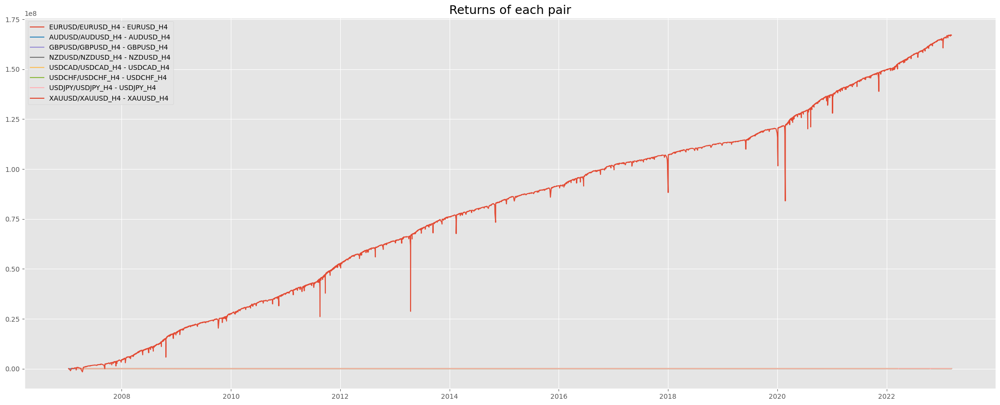

In [14]:
plt.figure(figsize = (26, 10))
for pair in range(len(pairs_list)):
    plt.plot(pairs_results[pair]['cum_res'], label = pairs_list[pair])
plt.legend()
plt.title('Returns of each pair', fontsize = 18)

***** STRATEGY PERFORMANCE *****
--------------------------------
CAGR: 873.9 %
Sharpe ratio: -0.0
Maximum drawdown 1321.13 % 

Number of trades: 37336
Number of profits: 18804
Number of losses: 18525
Number of breakevens: 7 

Winning percentage 50.37 %
ROI: 167649416
--------------------------------
Average profitable trade: 41825.45
Average lossing trade: -33405.47
Max profitable trade: 37806465.16
Max lossing trade: -18903232.58


c:\Users\Win10\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:57: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)


Text(0.5, 1.0, 'return of strategy')

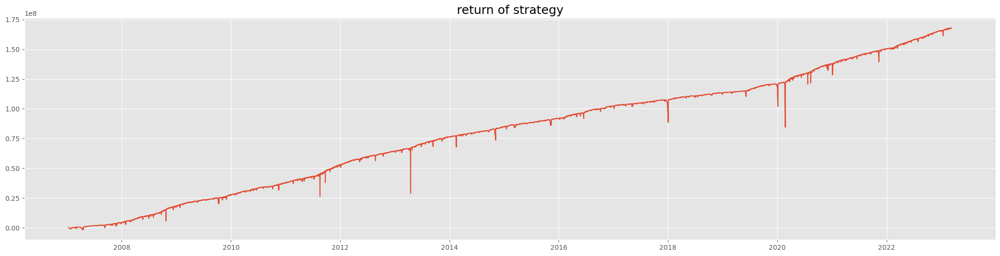

In [15]:
#Strategy performance
print('***** STRATEGY PERFORMANCE *****')
print('--------------------------------')
print('CAGR:', CAGR(strategy_results, df[0]), '%')
print('Sharpe ratio:', sharpe_ratio(strategy_results))
print('Maximum drawdown', max_drawdown(strategy_results), '% \n')
print('Number of trades:', len(str_profits + str_losses + str_be))
print('Number of profits:', len(str_profits))
print('Number of losses:', len(str_losses))
print('Number of breakevens:', len(str_be), '\n')
print('Winning percentage', (round(len(str_profits) / (len(str_profits) + len(str_losses)) * 100, 2)), '%')
print('ROI:', round(strategy_results['cum_res'][-1]) - account_size)
print('--------------------------------')
print('Average profitable trade:', round(sum(str_profits) / len(str_profits), 2))
print('Average lossing trade:', round(sum(str_losses) / len(str_losses), 2))
print('Max profitable trade:', round(max(str_profits), 2))
print('Max lossing trade:', round(min(str_losses), 2))

plt.figure(figsize = (26, 6))
plt.plot(strategy_results['cum_res'])
plt.title('return of strategy', fontsize = 18)

EURUSD/EURUSD_H4 - EURUSD_H4 - PERFORMANCE
--------------------------------
Number of trades: 4720
Number of profits: 2386
Number of losses: 2333
Number of breakevens: 1 

Winning percentage 50.56 %
ROI: 94724.64
--------------------------------
Average profitable trade: 220.92
Average lossing trade: -185.34
Max profitable trade: 81340.88
Max lossing trade: -40670.44
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxx 

Number of trades per day 
 day_of_trade
Fri     946
Mon     887
Sun      29
Thu    1035
Tue     916
Wed     907
Name: result, dtype: int64


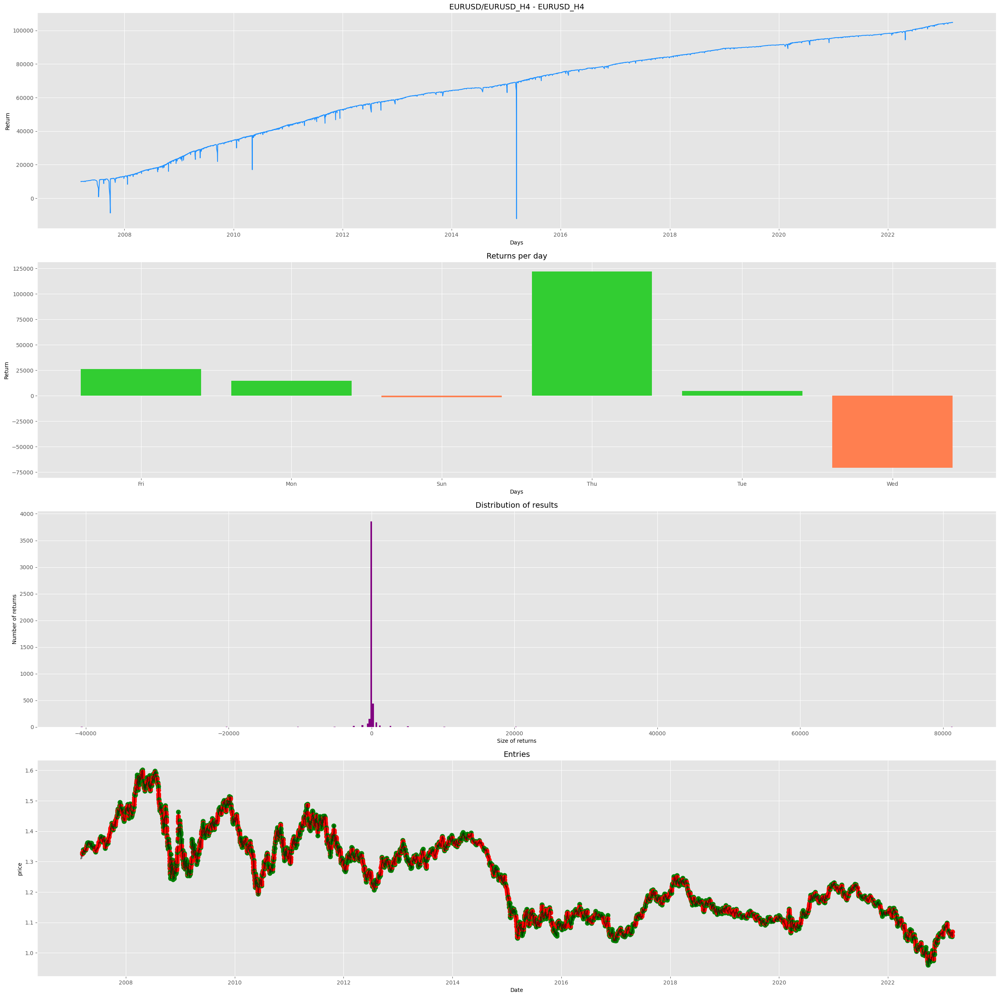

AUDUSD/AUDUSD_H4 - AUDUSD_H4 - PERFORMANCE
--------------------------------
Number of trades: 4758
Number of profits: 2351
Number of losses: 2406
Number of breakevens: 1 

Winning percentage 49.42 %
ROI: 83913.79
--------------------------------
Average profitable trade: 234.15
Average lossing trade: -193.92
Max profitable trade: 146386.19
Max lossing trade: -73193.1
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxx 

Number of trades per day 
 day_of_trade
Fri     869
Mon     849
Sun      52
Thu    1052
Tue     970
Wed     966
Name: result, dtype: int64


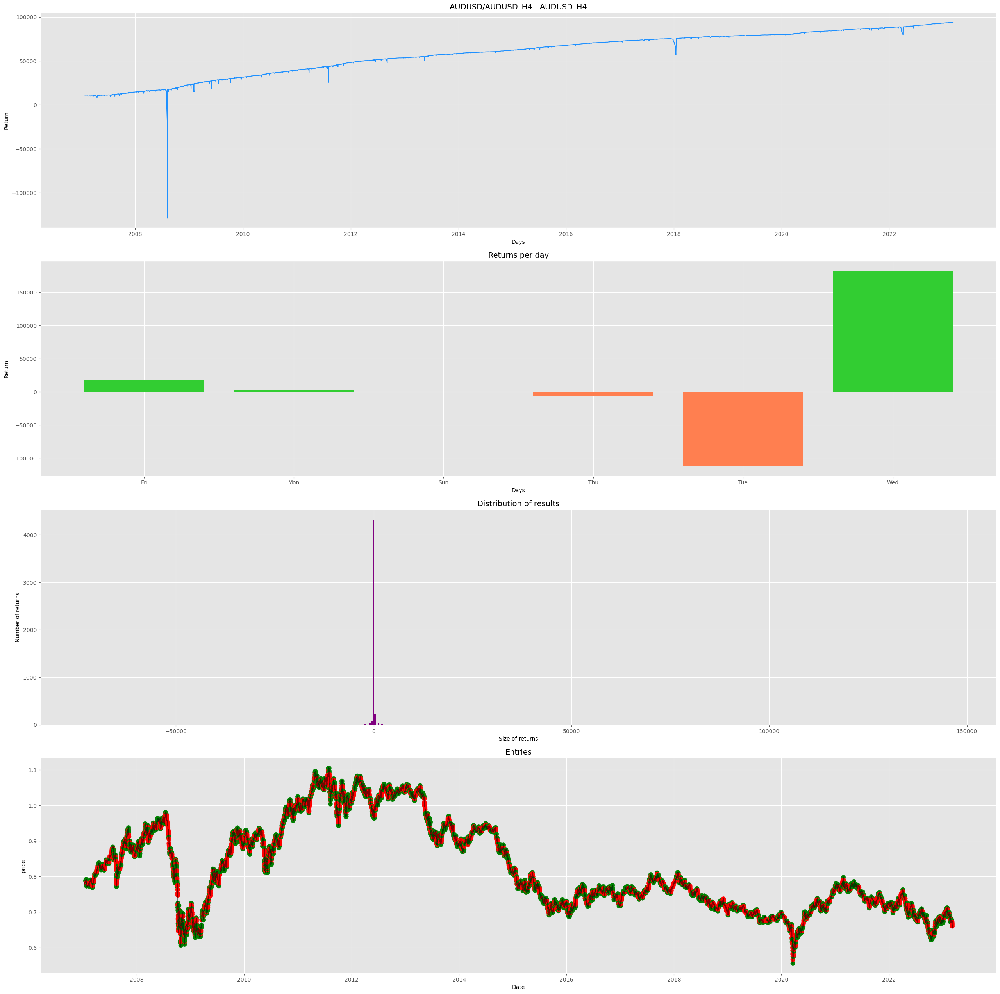

GBPUSD/GBPUSD_H4 - GBPUSD_H4 - PERFORMANCE
--------------------------------
Number of trades: 4682
Number of profits: 2343
Number of losses: 2338
Number of breakevens: 1 

Winning percentage 50.05 %
ROI: 115351.71
--------------------------------
Average profitable trade: 295.29
Average lossing trade: -246.59
Max profitable trade: 100958.22
Max lossing trade: -50479.11
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxx 

Number of trades per day 
 day_of_trade
Fri    923
Mon    876
Sun     58
Thu    932
Tue    939
Wed    954
Name: result, dtype: int64


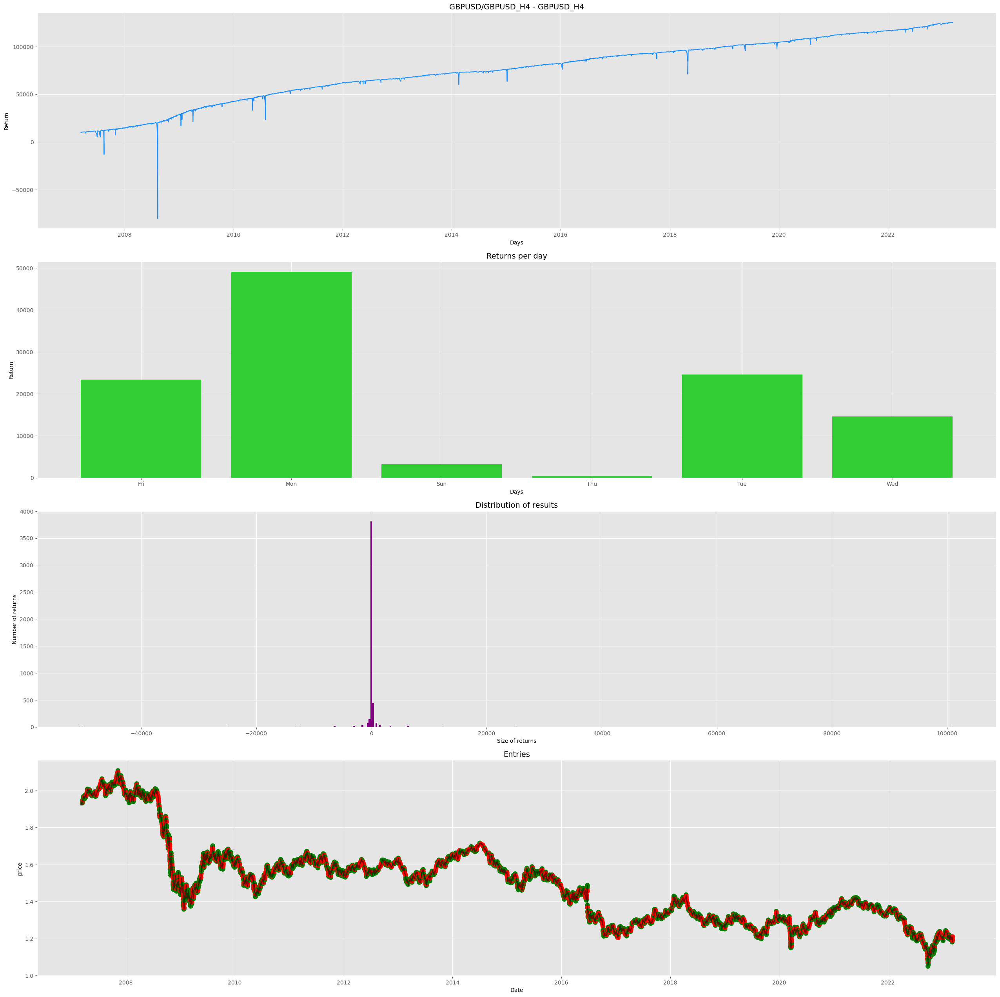

NZDUSD/NZDUSD_H4 - NZDUSD_H4 - PERFORMANCE
--------------------------------
Number of trades: 4726
Number of profits: 2366
Number of losses: 2359
Number of breakevens: 1 

Winning percentage 50.07 %
ROI: 79073.76
--------------------------------
Average profitable trade: 162.94
Average lossing trade: -129.9
Max profitable trade: 17111.69
Max lossing trade: -8555.84
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxx 

Number of trades per day 
 day_of_trade
Fri     904
Mon     838
Sun      37
Thu    1058
Tue     919
Wed     970
Name: result, dtype: int64


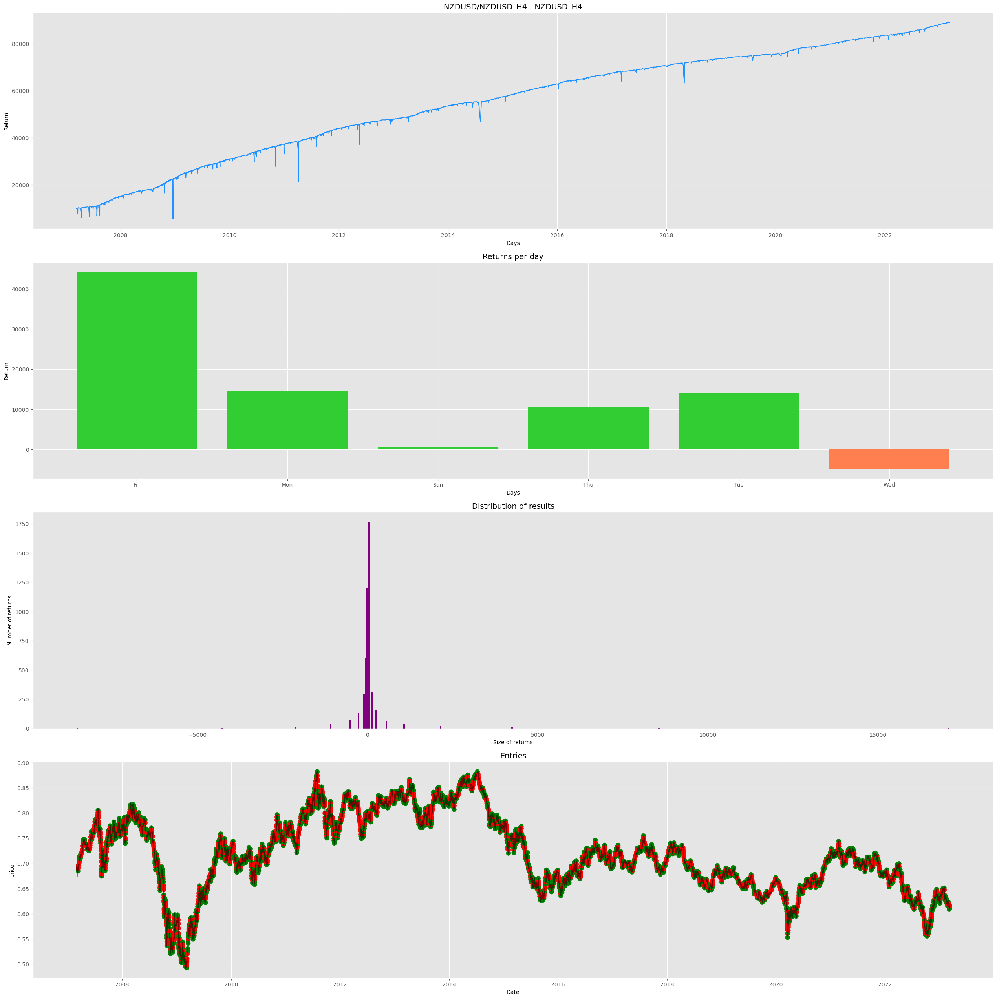

USDCAD/USDCAD_H4 - USDCAD_H4 - PERFORMANCE
--------------------------------
Number of trades: 4683
Number of profits: 2415
Number of losses: 2267
Number of breakevens: 1 

Winning percentage 51.58 %
ROI: 89724.72
--------------------------------
Average profitable trade: 168.38
Average lossing trade: -139.8
Max profitable trade: 76090.33
Max lossing trade: -38045.16
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxx 

Number of trades per day 
 day_of_trade
Fri    937
Mon    848
Sun     71
Thu    921
Tue    965
Wed    941
Name: result, dtype: int64


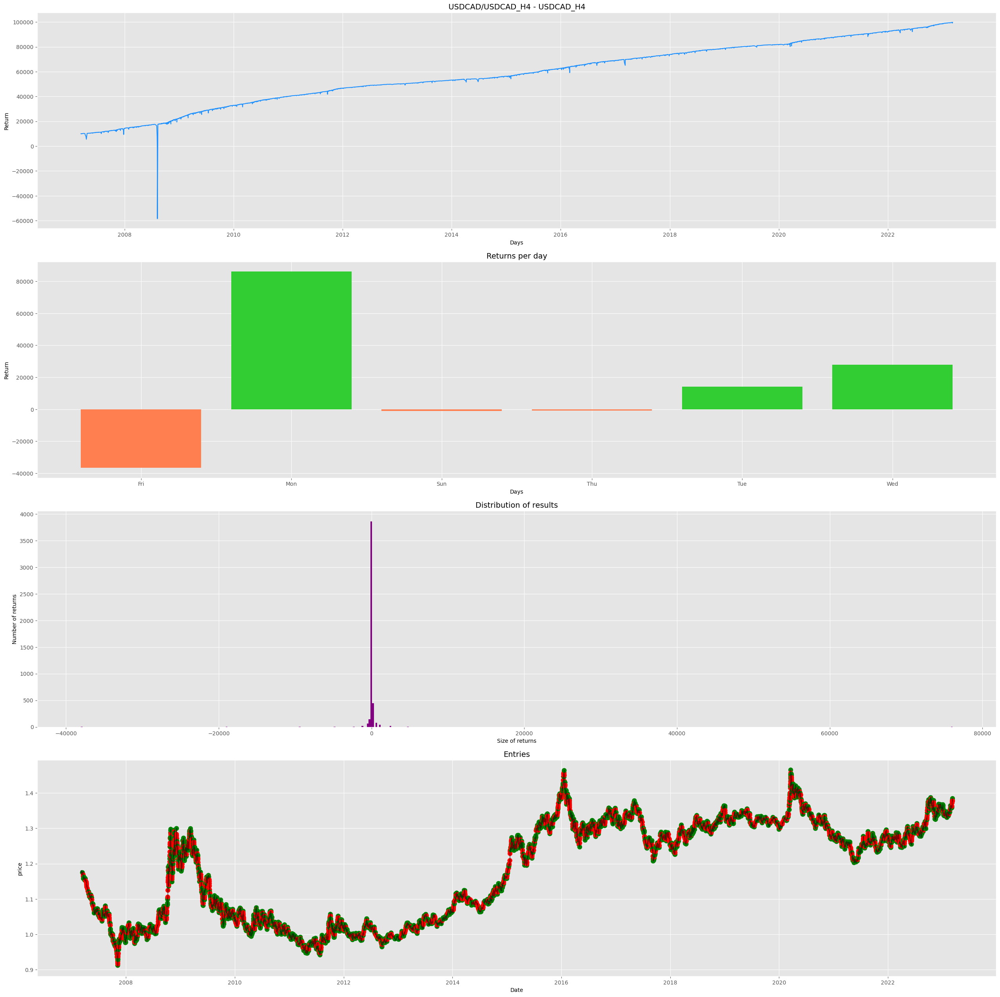

USDCHF/USDCHF_H4 - USDCHF_H4 - PERFORMANCE
--------------------------------
Number of trades: 4567
Number of profits: 2334
Number of losses: 2232
Number of breakevens: 1 

Winning percentage 51.12 %
ROI: 76556.06
--------------------------------
Average profitable trade: 188.09
Average lossing trade: -162.39
Max profitable trade: 33689.01
Max lossing trade: -16844.51
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxx 

Number of trades per day 
 day_of_trade
Fri    948
Mon    815
Sun     44
Thu    956
Tue    922
Wed    882
Name: result, dtype: int64


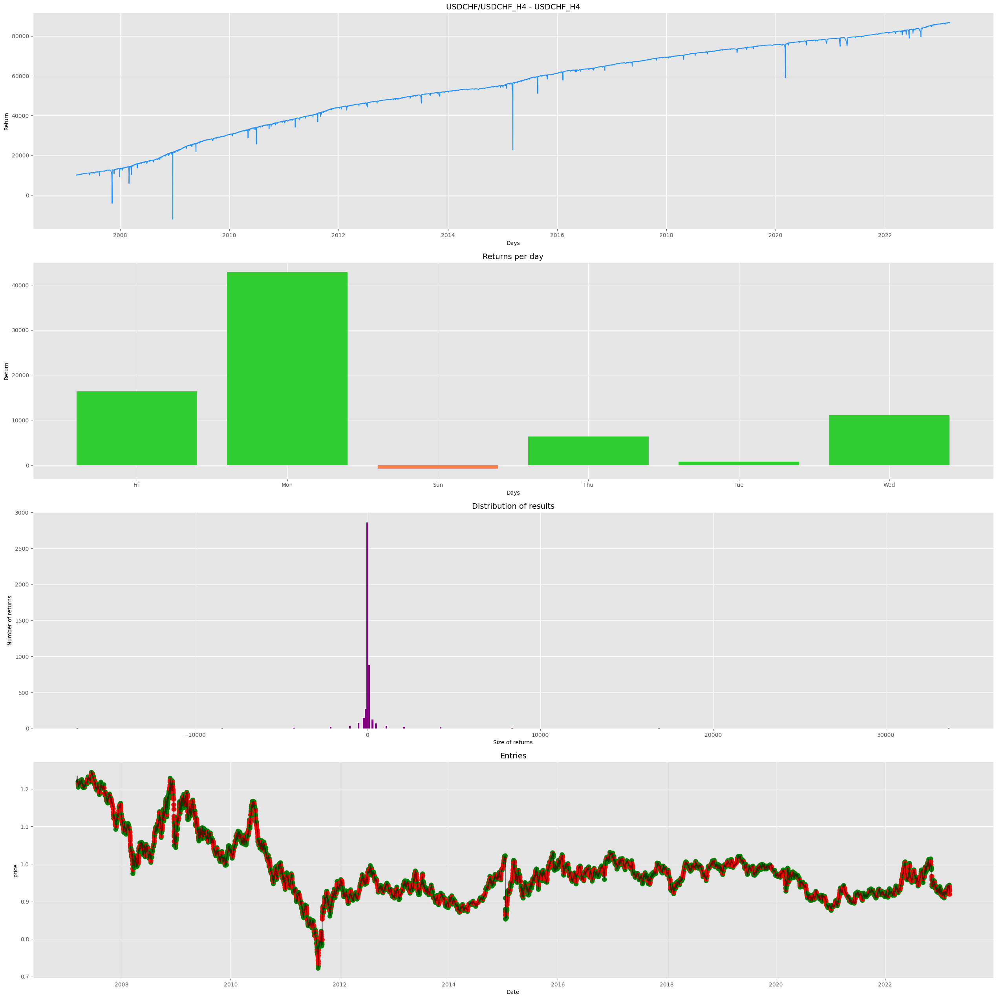

USDJPY/USDJPY_H4 - USDJPY_H4 - PERFORMANCE
--------------------------------
Number of trades: 4668
Number of profits: 2344
Number of losses: 2324
Number of breakevens: 0 

Winning percentage 50.21 %
ROI: 82290.92
--------------------------------
Average profitable trade: 361.3
Average lossing trade: -329.0
Max profitable trade: 287923.18
Max lossing trade: -143961.62
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxx 

Number of trades per day 
 day_of_trade
Fri    982
Mon    829
Sun     34
Thu    965
Tue    914
Wed    944
Name: result, dtype: int64


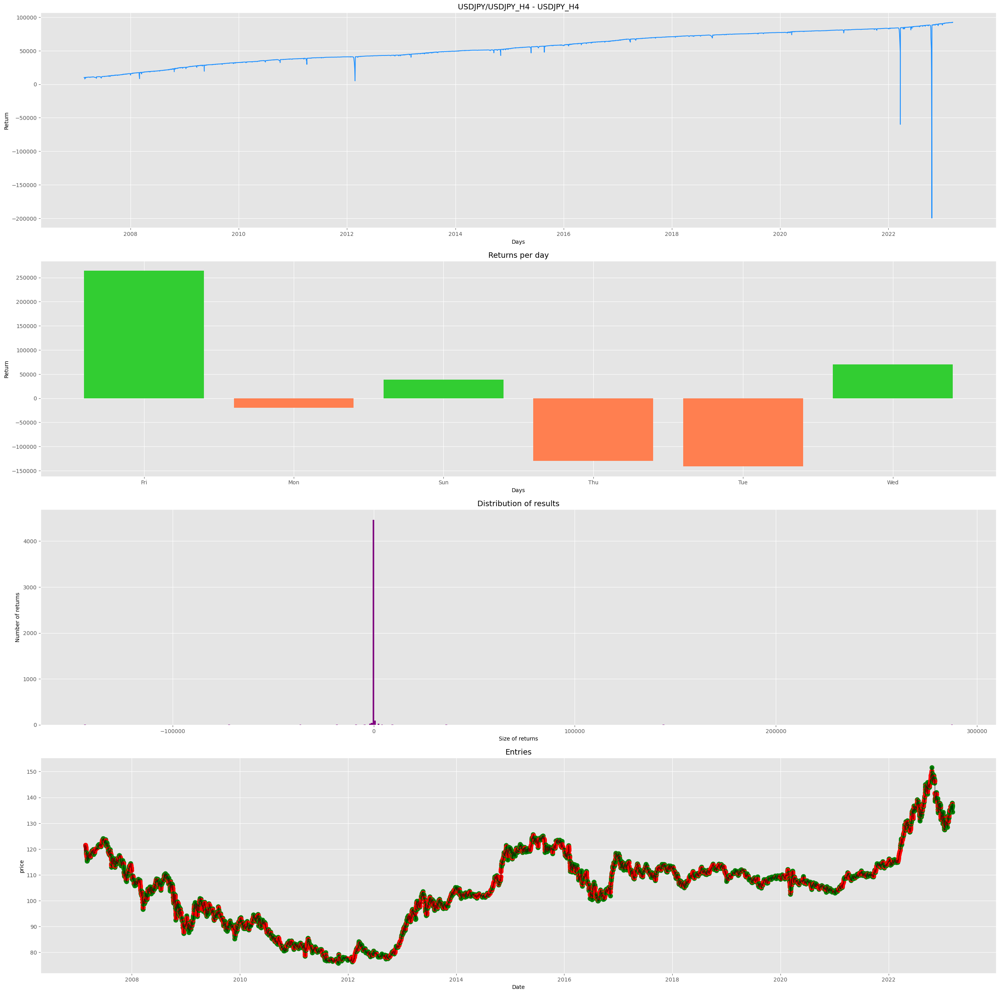

XAUUSD/XAUUSD_H4 - XAUUSD_H4 - PERFORMANCE
--------------------------------
Number of trades: 4532
Number of profits: 2265
Number of losses: 2266
Number of breakevens: 1 

Winning percentage 49.99 %
ROI: 167027780.74
--------------------------------
Average profitable trade: 345535.6
Average lossing trade: -271672.71
Max profitable trade: 37806465.16
Max lossing trade: -18903232.58
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxx 

Number of trades per day 
 day_of_trade
Fri    879
Mon    892
Sun     38
Thu    927
Tue    914
Wed    882
Name: result, dtype: int64


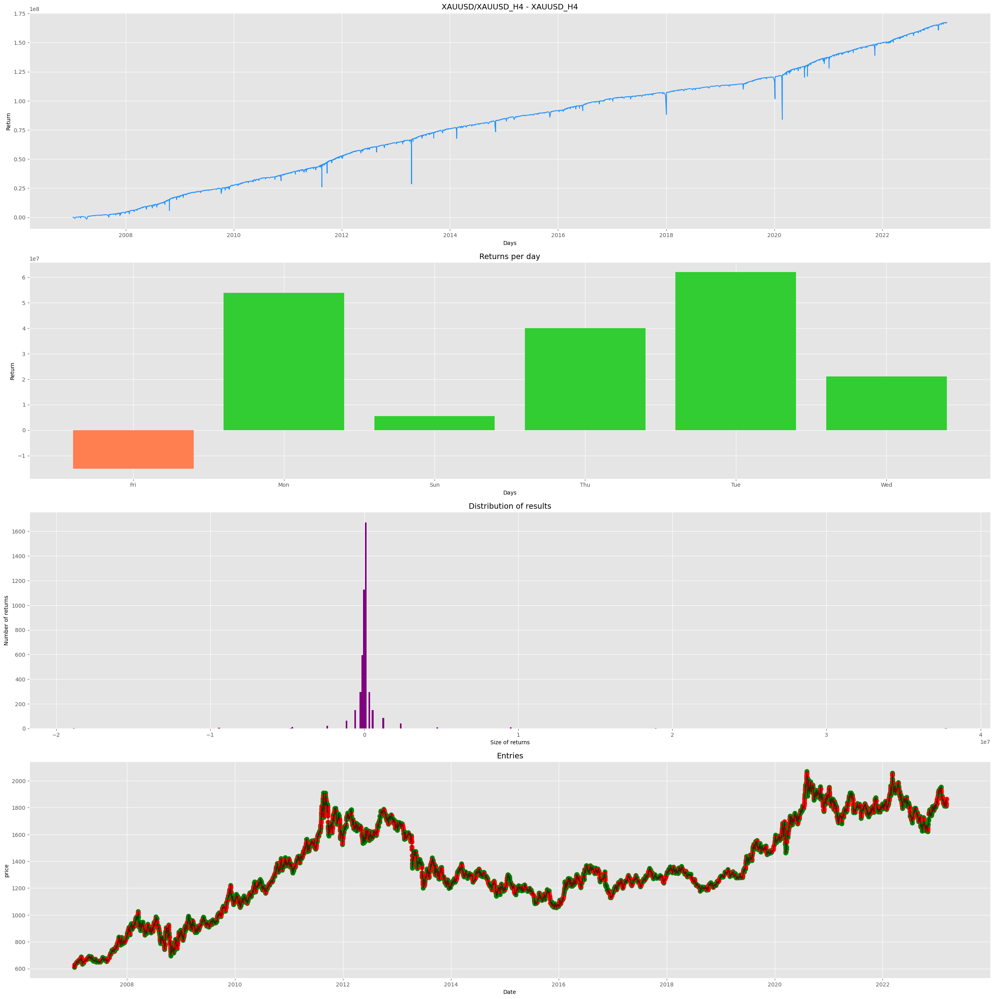

In [16]:
#performance for each pair
for pair in range(len(pairs_list)):
    print(pairs_list[pair], '- PERFORMANCE')
    print('--------------------------------')
    print('Number of trades:', len(profits[pair] + losses[pair] + be[pair]))
    print('Number of profits:', len(profits[pair]))
    print('Number of losses:', len(losses[pair]))
    print('Number of breakevens:', len(be[pair]), '\n')
    print('Winning percentage', (round(len(profits[pair]) / (len(profits[pair]) + len(losses[pair])) * 100, 2)), '%')
    print('ROI:', round(pairs_results[pair]['cum_res'][-1] - account_size, 2))
    print('--------------------------------')
    print('Average profitable trade:', round(sum(profits[pair]) / len(profits[pair]), 2))
    print('Average lossing trade:', round(sum(losses[pair]) / len(losses[pair]), 2))
    print('Max profitable trade:', round(max(profits[pair]), 2))
    print('Max lossing trade:', round(min(losses[pair]), 2))
    print('xxxxxxxxxxxxxxxxxxxxxxxxxxxxxx \n')
    
    trades_per_day = pairs_results[pair].groupby('day_of_trade').count()['result']
    day_return = pairs_results[pair].groupby('day_of_trade').sum()['result']
    day_return_positive = day_return > 0
    positive_results = pairs_results[pair]['result'] > 0
    
    print('Number of trades per day \n', trades_per_day)
    
    fig, axes = plt.subplots(4, 1, figsize = (26, 26))
    fig.tight_layout(pad = 4)
    
    axes[0].plot(pairs_results[pair]['cum_res'], color = 'dodgerblue')
    axes[0].set_title(pairs_list[pair], fontsize = 14)
    axes[0].set_xlabel('Days')
    axes[0].set_ylabel('Return')
    
    axes[1].bar(day_return.keys(), height = day_return, color = day_return_positive.map({True: 'limegreen', False: 'coral'}))
    axes[1].set_title('Returns per day', fontsize = 14)
    axes[1].set_xlabel('Days')
    axes[1].set_ylabel('Return')
    
    axes[2].hist(pairs_results[pair]['result'], bins = 500, color = 'purple')
    axes[2].set_title('Distribution of results', fontsize = 14)
    axes[2].set_xlabel('Size of returns')
    axes[2].set_ylabel('Number of returns')
    
    axes[3].plot(df[pair]['Close'], color = 'black', alpha = 0.5)
    axes[3].scatter(pairs_results[pair].index, pairs_results[pair]['entry_price'], s = 70, color = positive_results.map({True: 'green', False: 'red'}))
    axes[3].set_title('Entries', fontsize = 14)
    axes[3].set_xlabel('Date')
    axes[3].set_ylabel('price')
    
    plt.show()